In [1]:
# mount the colab notebook onto drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##***Import Libraries*** 

In [2]:
# import essential libraries and download tools if required.

import pandas as pd 
import numpy as np 
import seaborn as sns
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt

%matplotlib inline
import wordcloud
import warnings
warnings.filterwarnings("ignore")
from wordcloud import WordCloud, STOPWORDS


In [3]:
!pip install surprise

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 11.8 MB 3.9 MB/s 
  Created wheel for scikit-surprise: filename=scikit_surprise-1.1.1-cp37-cp37m-linux_x86_64.whl size=1633966 sha256=5077466f2fdc523b8490b65b4676ecdffbccdc759121a92310d316b2dfb8da25
  Stored in directory: /root/.cache/pip/wheels/76/44/74/b498c42be47b2406bd27994e16c5188e337c657025ab400c1c
Successfully built scikit-surprise


## ***Helper Functions***

In [4]:
# function to plot the images of the books, given the amazon web links of the images from the dataset
def show_books(dataframe):
  ''' plots the image of the book using the link in the dataframe
  parameters: 
          dataframe- data'''

  for i in dataframe['Image-URL-L']:
        response = requests.get(i)
        img = Image.open(BytesIO(response.content))
        plt.figure()
        plt.imshow(img)

##***Obtain Data***

###**Dataset** 

[Source](http://www2.informatik.uni-freiburg.de/~cziegler/BX/)

  During the last few decades, with the rise of Youtube, Amazon, Netflix, and many other such web services, recommender systems have taken more and more place in our lives. From e-commerce (suggest to buyers articles that could interest them) to online advertisement (suggest to users the right contents, matching their preferences), recommender systems are today unavoidable in our daily online journeys.

In a very general way, **recommender systems** are algorithms aimed at suggesting relevant items to users (items being movies to watch, text to read, products to buy, or anything else depending on industries).

**Recommender systems** are really critical in some industries as they can generate a huge amount of income when they are efficient or also be a way to stand out significantly from competitors. **The main objective is to create a book recommendation system for users.**

**Dataset Information:**

The Book-Crossing dataset comprises the following 3 files.

● Users

Contains the users. Note that user IDs (**User-ID**) have been anonymized and map to
integers. Demographic data is provided (**Location, Age**) if available. Otherwise, these fields contain NULL values.

● Books

Books are identified by their respective ISBN. Invalid ISBNs have already been removed from the dataset. Moreover, some content-based information is given (**Book-Title,Book-Author, Year-Of-Publication, Publisher**), obtained from Amazon Web Services. Note that in the case of several authors, only the first is provided. URLs linking to cover images are also given, appearing in three different flavors (**Image-URL-S,Image-URL-M, Image-URL-L**), i.e., small, medium, large. These URLs point to the Amazon website.

● Ratings

Contains the book rating information. Ratings (**Book-Rating**) are either explicit, expressed on a scale from 1-10 (higher values denoting higher appreciation), or implicit,expressed by 0.

In [5]:
# read the books dataset and observe the overview of the dataset
books_df=pd.read_csv("/content/drive/MyDrive/Almabetter/capstone projects/Book Recommendation System/Dataset/Books.csv")
books_df.head(3)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...


In [6]:
# read the ratings dataset and observe the overview of the dataset

ratings_df=pd.read_csv("/content/drive/MyDrive/Almabetter/capstone projects/Book Recommendation System/Dataset/Ratings.csv")
ratings_df.head(3)

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0


In [7]:
# read the users dataset and observe the overview of the dataset

users_df=pd.read_csv("/content/drive/MyDrive/Almabetter/capstone projects/Book Recommendation System/Dataset/Users.csv")
users_df.head(3)

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN


##***Data Preprocessing And Exploratory Data Analysis***


####***1. Books Dataset***

In [8]:
books_df.head(3)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...


In [9]:
books_df.shape

(271360, 8)

In [10]:
books_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271359 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


There are missing values present in the dataset in the columns namely *Image-URL-L, Book-Author, Publisher*.

In [11]:
# Check for null values
books_df.isnull().sum() 

ISBN                   0
Book-Title             0
Book-Author            1
Year-Of-Publication    0
Publisher              2
Image-URL-S            0
Image-URL-M            0
Image-URL-L            3
dtype: int64

In [12]:
# check for duplicates
books_df.duplicated().sum()

0

In [13]:
# check for unique number of books
books_df['ISBN'].nunique()

271360

All the observations in the "books"-dataset contain unique books, no duplicate books registered.

In [14]:
# drop the columns that aren't necessary for further analysis.
books_df.drop(['Image-URL-S','Image-URL-M'], axis=1, inplace=True)

In [15]:
# observe the correctness of feature- Year=Of-Publication
list(books_df['Year-Of-Publication'].unique())


[2002,
 2001,
 1991,
 1999,
 2000,
 1993,
 1996,
 1988,
 2004,
 1998,
 1994,
 2003,
 1997,
 1983,
 1979,
 1995,
 1982,
 1985,
 1992,
 1986,
 1978,
 1980,
 1952,
 1987,
 1990,
 1981,
 1989,
 1984,
 0,
 1968,
 1961,
 1958,
 1974,
 1976,
 1971,
 1977,
 1975,
 1965,
 1941,
 1970,
 1962,
 1973,
 1972,
 1960,
 1966,
 1920,
 1956,
 1959,
 1953,
 1951,
 1942,
 1963,
 1964,
 1969,
 1954,
 1950,
 1967,
 2005,
 1957,
 1940,
 1937,
 1955,
 1946,
 1936,
 1930,
 2011,
 1925,
 1948,
 1943,
 1947,
 1945,
 1923,
 2020,
 1939,
 1926,
 1938,
 2030,
 1911,
 1904,
 1949,
 1932,
 1928,
 1929,
 1927,
 1931,
 1914,
 2050,
 1934,
 1910,
 1933,
 1902,
 1924,
 1921,
 1900,
 2038,
 2026,
 1944,
 1917,
 1901,
 2010,
 1908,
 1906,
 1935,
 1806,
 2021,
 '2000',
 '1995',
 '1999',
 '2004',
 '2003',
 '1990',
 '1994',
 '1986',
 '1989',
 '2002',
 '1981',
 '1993',
 '1983',
 '1982',
 '1976',
 '1991',
 '1977',
 '1998',
 '1992',
 '1996',
 '0',
 '1997',
 '2001',
 '1974',
 '1968',
 '1987',
 '1984',
 '1988',
 '1963',
 '1956',
 

* Some of the values corresponding to the column *Year-Of-Publication* are incorrectly registered as the *Publisher* value. 
* Few of the entries are of type- String

In [16]:
# locate the incorrect entries
pd.set_option('display.max_colwidth', -1)
books_df.loc[books_df['Year-Of-Publication'] == 'DK Publishing Inc',:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-L
209538,078946697X,"DK Readers: Creating the X-Men, How It All Began (Level 4: Proficient Readers)\"";Michael Teitelbaum""",2000,DK Publishing Inc,http://images.amazon.com/images/P/078946697X.01.THUMBZZZ.jpg,NaN
221678,0789466953,"DK Readers: Creating the X-Men, How Comic Books Come to Life (Level 4: Proficient Readers)\"";James Buckley""",2000,DK Publishing Inc,http://images.amazon.com/images/P/0789466953.01.THUMBZZZ.jpg,NaN


In [17]:
# locate the incorrect entries
books_df.loc[books_df['Year-Of-Publication'] == 'Gallimard',:]


,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-L
220731,2070426769,"Peuple du ciel, suivi de 'Les Bergers\"";Jean-Marie Gustave Le ClÃ?Â©zio""",2003,Gallimard,http://images.amazon.com/images/P/2070426769.01.THUMBZZZ.jpg,NaN


Entries in the columns Publisher,*Year-Of-Publication, Book-Title, Book-Author* are mismatched.

In [18]:
# anomalous entries are corrected 

books_df.at[209538 ,'Publisher'] = 'DK Publishing Inc'
books_df.at[209538 ,'Year-Of-Publication'] = 2000
books_df.at[209538 ,'Book-Title'] = 'DK Readers: Creating the X-Men, How It All Began (Level 4: Proficient Readers)'
books_df.at[209538 ,'Book-Author'] = 'Michael Teitelbaum'

books_df.at[221678 ,'Publisher'] = 'DK Publishing Inc'
books_df.at[221678 ,'Year-Of-Publication'] = 2000
books_df.at[209538 ,'Book-Title'] = 'DK Readers: Creating the X-Men, How Comic Books Come to Life (Level 4: Proficient Readers)'
books_df.at[209538 ,'Book-Author'] = 'James Buckley'

books_df.at[220731 ,'Publisher'] = 'Gallimard'
books_df.at[220731 ,'Year-Of-Publication'] = 2003
books_df.at[209538 ,'Book-Title'] = 'Peuple du ciel - Suivi de Les bergers '
books_df.at[209538 ,'Book-Author'] = 'Jean-Marie Gustave Le ClÃ?Â©zio'

In [19]:
# convert all the entries of column 'Year-Of-Publication' to type-integers

books_df['Year-Of-Publication']=pd.to_numeric(books_df['Year-Of-Publication'], errors='coerce')
print(sorted(books_df['Year-Of-Publication'].unique()))

[0, 1376, 1378, 1806, 1897, 1900, 1901, 1902, 1904, 1906, 1908, 1909, 1910, 1911, 1914, 1917, 1919, 1920, 1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942, 1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953, 1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2008, 2010, 2011, 2012, 2020, 2021, 2024, 2026, 2030, 2037, 2038, 2050]


* The dataset was collected in the year 2004. 
* Therefore the entries beyond 2004 doesn't make sense. Therefore replace with median value.
* Invalid entries like 0, are replaced with the median value. 

In [20]:
# replace the '0' entries/ invalid entries with NaN
books_df.loc[(books_df['Year-Of-Publication'] > 2004) | (books_df['Year-Of-Publication'] == 0),'Year-Of-Publication'] = np.NAN
# replace the NaN values with median
books_df['Year-Of-Publication'].fillna(round(books_df['Year-Of-Publication'].median()), inplace=True)

In [21]:
books_df.isna().sum()

ISBN                   0
Book-Title             0
Book-Author            1
Year-Of-Publication    0
Publisher              2
Image-URL-L            3
dtype: int64

Identify the missing values in respective columns and impute with suitable dummy variable.

In [22]:
# missing values in column- Publisher.
books_df.loc[books_df.Publisher.isnull(),:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-L
128890,193169656X,Tyrant Moon,Elaine Corvidae,2002.0,NaN,http://images.amazon.com/images/P/193169656X.01.LZZZZZZZ.jpg
129037,1931696993,Finders Keepers,Linnea Sinclair,2001.0,NaN,http://images.amazon.com/images/P/1931696993.01.LZZZZZZZ.jpg


In [23]:
# missing values in column- Book-Author.
books_df.loc[books_df['Book-Author'].isnull(),:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-L
187689,9627982032,The Credit Suisse Guide to Managing Your Personal Wealth,NaN,1995.0,Edinburgh Financial Publishing,http://images.amazon.com/images/P/9627982032.01.LZZZZZZZ.jpg


In [24]:
# missing values in column- Image-URL-L.
books_df.loc[books_df['Image-URL-L'].isnull(),:]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-L
209538,078946697X,Peuple du ciel - Suivi de Les bergers,Jean-Marie Gustave Le ClÃ?Â©zio,2000.0,DK Publishing Inc,NaN
220731,2070426769,"Peuple du ciel, suivi de 'Les Bergers\"";Jean-Marie Gustave Le ClÃ?Â©zio""",2003,2003.0,Gallimard,NaN
221678,0789466953,"DK Readers: Creating the X-Men, How Comic Books Come to Life (Level 4: Proficient Readers)\"";James Buckley""",2000,2000.0,DK Publishing Inc,NaN


In [25]:
# impute the missing values with dummy variable
books_df.Publisher.fillna('others',inplace=True)
books_df['Book-Author'].fillna('others',inplace=True)
books_df['Image-URL-L'].fillna('others',inplace=True)

In [26]:
# verify the count of missing values 
books_df.isna().sum()

ISBN                   0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
Image-URL-L            0
dtype: int64

In [27]:
books_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 6 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ISBN                 271360 non-null  object 
 1   Book-Title           271360 non-null  object 
 2   Book-Author          271360 non-null  object 
 3   Year-Of-Publication  271360 non-null  float64
 4   Publisher            271360 non-null  object 
 5   Image-URL-L          271360 non-null  object 
dtypes: float64(1), object(5)
memory usage: 12.4+ MB


####***2. Ratings dataset***

In [28]:
ratings_df.head(3)

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0


In [29]:
ratings_df.shape

(1149780, 3)

In [30]:
# Check for null values
ratings_df.isnull().sum() 

User-ID        0
ISBN           0
Book-Rating    0
dtype: int64

In [31]:
ratings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149780 non-null  int64 
 1   ISBN         1149780 non-null  object
 2   Book-Rating  1149780 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB


* Keep the observations that are relevant to the books in the "Books" dataset.
* The observations corresponding to the ratings of the books that are outside the "Books" dataset are dropped.

In [32]:
# consider ratings if it's ISBN is present in the "Books" dataset.
ratings_df = ratings_df[ratings_df.ISBN.isin(books_df.ISBN)]


In [33]:
print("shape of updated ratings dataset", ratings_df.shape)

shape of updated ratings dataset (1031136, 3)


"Ratings" dataset contains the book rating information where ratings (*Book-Rating*) are either **explicit**, expressed on a scale from 1-10 (higher values denoting higher appreciation), or **implicit**, expressed by 0. 

* Only the explicit ratings are considered to be effectively rated by the user, where the least rating possible is 1. 

* 0 ratings indicate no user involvement in the book ratings. Hence the implicit ratings are dropped.

In [34]:
# consider the observations corresponding to the non-zero(explicit) values.
ratings_df = ratings_df[ratings_df['Book-Rating'] != 0]


In [35]:
print("shape of updated ratings dataset", ratings_df.shape)

shape of updated ratings dataset (383842, 3)


In [36]:
ratings_df["ISBN"].nunique()
# "Ratings" dataset contains 149836 unique books where some books are rated by multiple users, therefore the shape of dataset is 383842.

149836

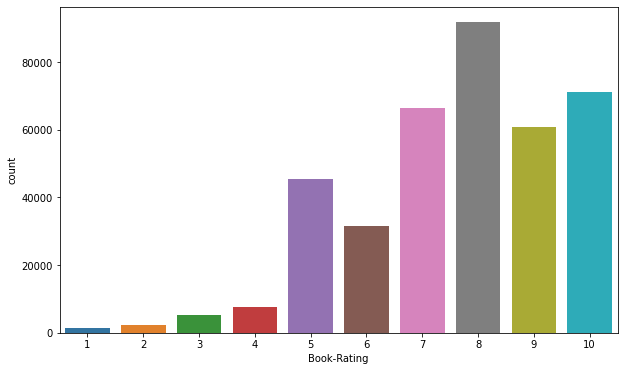

In [37]:
# plot the count of explicit ratings scale from 1-10   
plt.figure(figsize=(10,6))
sns.countplot(x="Book-Rating", data=ratings_df)

Many books are highly rated. Most of them are rated 8.

####***3. Users Dataset***

In [38]:
users_df.head(3)

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN


In [39]:
users_df['User-ID'].nunique()

278858

In [40]:
users_df.shape

(278858, 3)

In [41]:
# check the missing values
users_df.isna().sum()

User-ID     0     
Location    0     
Age         110762
dtype: int64

In [42]:
median_value = round(users_df['Age'].median())   


Handle missing values

In [43]:
## replace the missing with the median value.
users_df['Age'] = users_df['Age'].fillna(median_value)    
users_df['Age'] = users_df['Age'].astype(int) 

In [44]:
users_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   User-ID   278858 non-null  int64 
 1   Location  278858 non-null  object
 2   Age       278858 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 6.4+ MB


* Observe the outliers in the feature- Age
* Replace the outliers with median value

Text(0.5, 1.0, 'Outliers: Age')

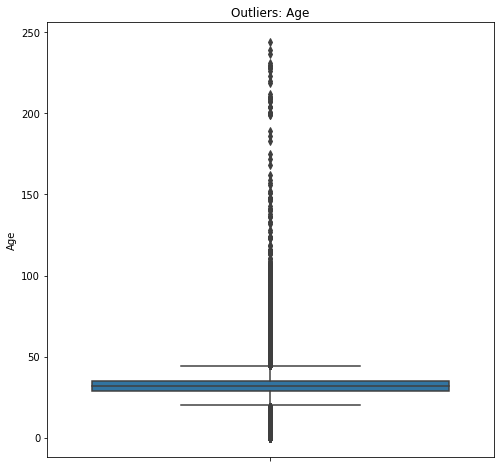

In [45]:
# plot the outliers 
plt.figure(figsize=(8,8))
sns.boxplot(y='Age', data=users_df)
plt.title('Outliers: Age')

Handle the outliers
* The entries in the feature-Age are beyond 100
* Replace the entries lesser than 10 and greater than 80 with median value.

In [46]:
# replace the outliers with median value
users_df.loc[users_df['Age'] > 80, 'Age'] = median_value     
users_df.loc[users_df['Age'] < 10, 'Age'] = median_value   


In [47]:
users_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   User-ID   278858 non-null  int64 
 1   Location  278858 non-null  object
 2   Age       278858 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 6.4+ MB


####***Merging Datasets and Feature Engineering***


In [48]:
print('Books:', books_df.shape)
print('Ratings:', ratings_df.shape)
print('Users:', users_df.shape)

Books: (271360, 6)
Ratings: (383842, 3)
Users: (278858, 3)


In [49]:
# merging the "Ratings" and "Books" dataset on common column "ISBN"
temp= pd.merge(books_df,ratings_df,on='ISBN')
# finally merge the obtained dataset with "Users" dataset on common column 'User-ID'
data= pd.merge(temp,users_df,on='User-ID')


In [50]:
# Therefore the shape of the dataset after merging all the datasets
data.shape

(383842, 10)

In [51]:
data.head(3)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-L,User-ID,Book-Rating,Location,Age
0,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg,8,5,"timmins, ontario, canada",32
1,074322678X,Where You'll Find Me: And Other Stories,Ann Beattie,2002.0,Scribner,http://images.amazon.com/images/P/074322678X.01.LZZZZZZZ.jpg,8,5,"timmins, ontario, canada",32
2,0887841740,The Middle Stories,Sheila Heti,2004.0,House of Anansi Press,http://images.amazon.com/images/P/0887841740.01.LZZZZZZZ.jpg,8,5,"timmins, ontario, canada",32


* Extract the information of *Country* and *State* names from the column-*Location* and drop the column.

In [52]:
# extract the "Country", "State" from the location information
data['Country']= [(i.split(',')[2]) for i in data['Location']]
data['State']= [(i.split(',')[1]) for i in data['Location']]


In [53]:
# replace the invalid entries in the country and state names with dummy variable
data['Country'] =data['Country'].replace({" ":'Other',"":'Other', ' n/a':'Other',  '\\"n/a\\""' :'Other'})
data['State'] = data['State'].replace({" ":'Other', "":'Other',' n/a':'Other',  '\\"n/a\\""' :'Other'})

In [54]:
# drop the feature-"Location"  
data.drop(['Location'], axis=1,inplace=True)

* Adding new features- *Average-Rating* and  *Book-Rating-Count* 

In [55]:
# obtain the feature -Average-Rating of the book by performing aggregate-mean of ratings on the particular book
avg_ratings= pd.DataFrame(data.groupby('ISBN')[['Book-Rating']].mean().reset_index().rename(columns = {'Book-Rating': 'Average-Rating'}))

# obtain the feature -Book-Rating-Count of the book by obtaining the count of ratings on the particular book
ratings_count= pd.DataFrame(data.groupby('ISBN')['Book-Rating'].count().reset_index().rename(columns = {'Book-Rating': 'Book-Rating-Count'}))


In [56]:
# merging the new features into the ratings dataset on common column "ISBN"
data =pd.merge(data, avg_ratings, on='ISBN')
data =pd.merge(data,ratings_count, on='ISBN')


In [57]:
data.shape

(383842, 13)

In [58]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 383842 entries, 0 to 383841
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ISBN                 383842 non-null  object 
 1   Book-Title           383842 non-null  object 
 2   Book-Author          383842 non-null  object 
 3   Year-Of-Publication  383842 non-null  float64
 4   Publisher            383842 non-null  object 
 5   Image-URL-L          383842 non-null  object 
 6   User-ID              383842 non-null  int64  
 7   Book-Rating          383842 non-null  int64  
 8   Age                  383842 non-null  int64  
 9   Country              383842 non-null  object 
 10  State                383842 non-null  object 
 11  Average-Rating       383842 non-null  float64
 12  Book-Rating-Count    383842 non-null  int64  
dtypes: float64(2), int64(4), object(7)
memory usage: 41.0+ MB


In [59]:
data.head(3)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-L,User-ID,Book-Rating,Age,Country,State,Average-Rating,Book-Rating-Count
0,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg,8,5,32,canada,ontario,7.666667,9
1,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg,11676,8,32,Other,Other,7.666667,9
2,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg,67544,8,30,canada,ontario,7.666667,9


####***Data Visualization***

#####***Word-Cloud for Book-Titles***

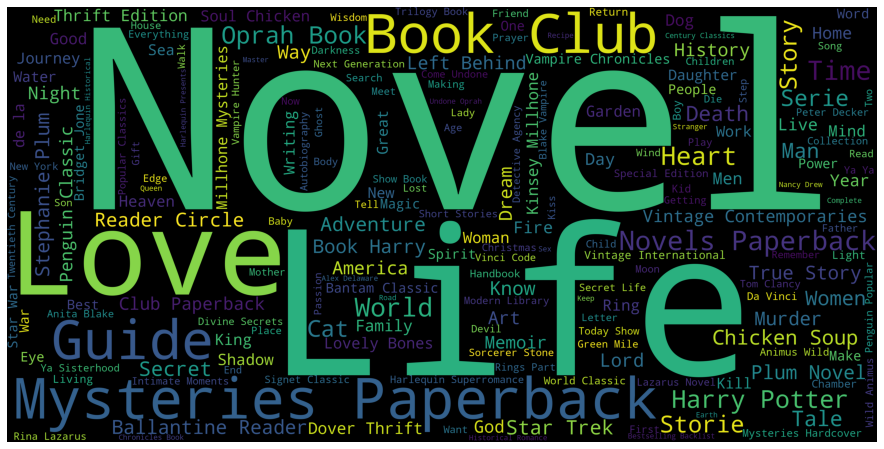

In [60]:
# create a wordcloud of the book titles
data['Book-Title'] = data['Book-Title'].fillna("").astype('str')
title_corpus = ' '.join(data['Book-Title'])
title_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', height=2000, width=4000).generate(title_corpus) # ignore the stopwords 

# plot the wordcloud
plt.figure(figsize=(16,8))
plt.imshow(title_wordcloud)
plt.axis('off')
plt.show()

#####***Analysis of number of books*** 

* **Book-Authors**

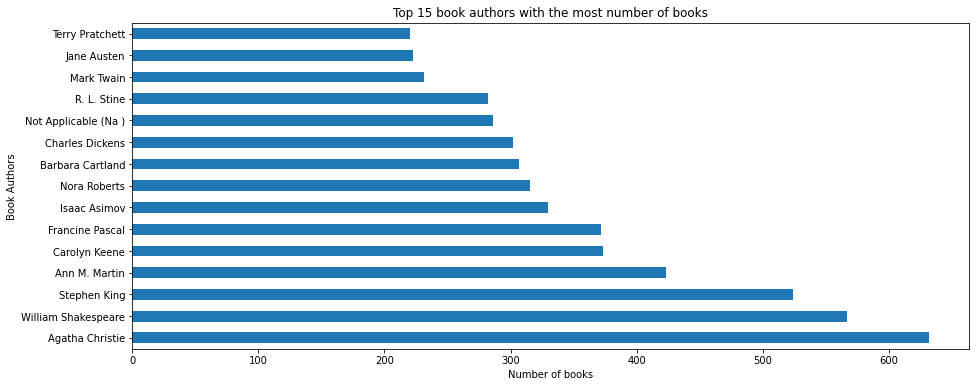

In [61]:
# plot the number of books written by authors arranged in decreasing fashion
books_df['Book-Author'].value_counts().sort_values(ascending=False)[:15].plot.barh(figsize=(15,6))
plt.xlabel('Number of books')
plt.ylabel('Book Authors')
plt.title('Top 15 book authors with the most number of books')
plt.show()

* **Year-Of-Publication**

Text(0.5, 1.0, 'Top 15 years with the most number of books published')

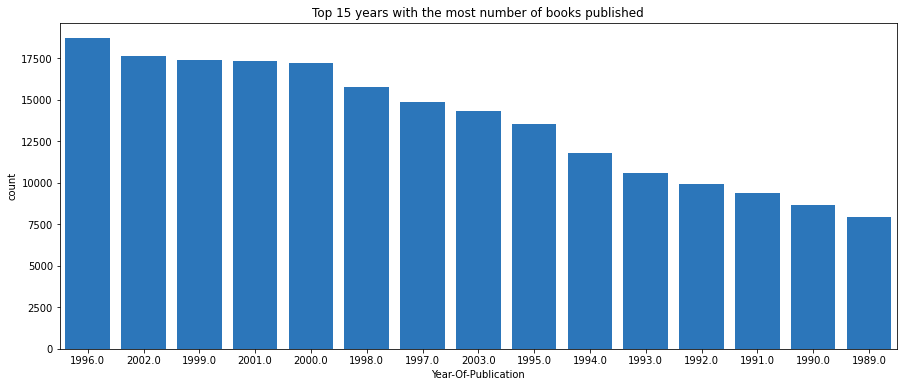

In [62]:
# plot the number of books published in every year arranged in decreasing fashion
plt.figure(figsize=(15,6))
sns.countplot(x="Year-Of-Publication", data=books_df, order=books_df['Year-Of-Publication'].value_counts().index[0:15],palette=[ "#1477d2"])
plt.title("Top 15 years with the most number of books published")

* **Publisher** 

Text(0.5, 1.0, 'Top 15 publishers with the most number of publications')

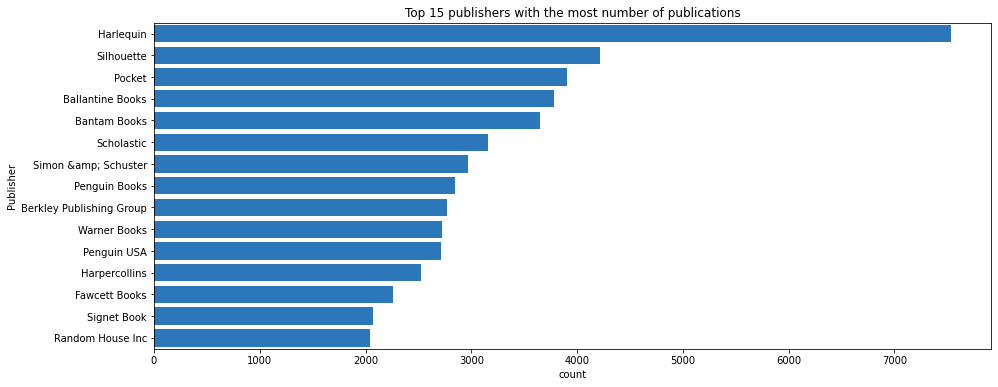

In [63]:
# plot the number of books published by publishers and arrange in decreasing manner
plt.figure(figsize=(15,6))
sns.countplot(y="Publisher", data=books_df, order=books_df['Publisher'].value_counts().index[0:15],palette=[ "#1477d2"])
plt.title("Top 15 publishers with the most number of publications")

* **Country**

Text(0.5, 1.0, 'Top 15 countries with the most number of books published')

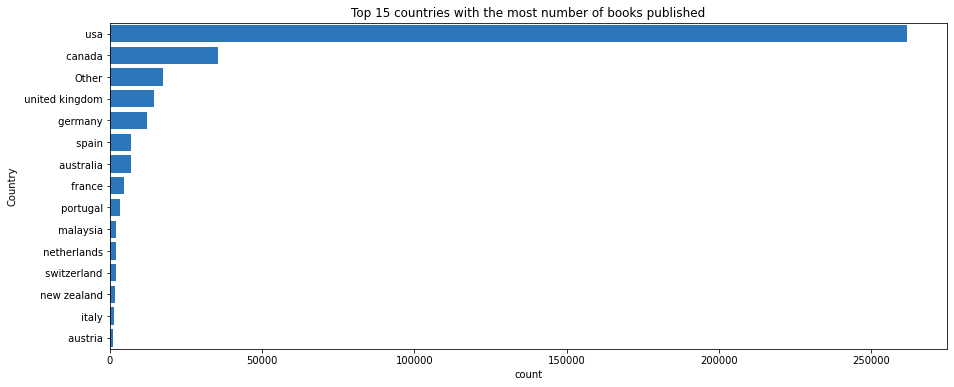

In [64]:
# plot the number of books published in each country arranged in decreasing manner
plt.figure(figsize=(15,6))
sns.countplot(y="Country", data=data, order=data['Country'].value_counts().index[0:15],palette=[ "#1477d2"])
plt.title("Top 15 countries with the most number of books published")

* **Age**

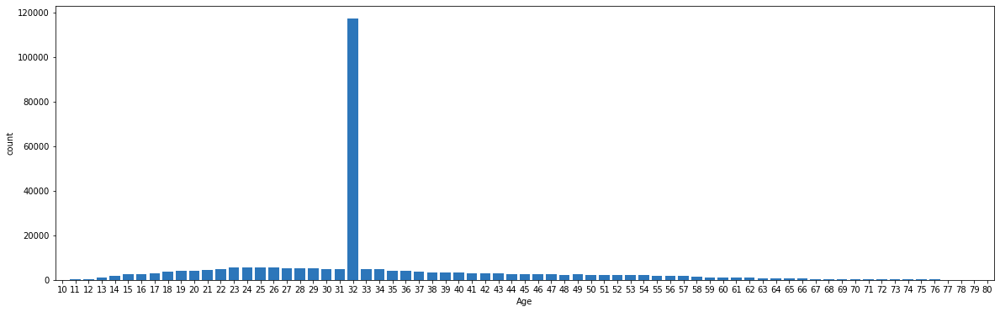

In [65]:
# plot the number of books written by authors of each age group
plt.figure(figsize=(20,6))
sns.countplot(x="Age", data=users_df,palette=[ "#1477d2"])

* Most of the values are 32, resulting from the outlier and missing values replacement with median value.
* The information regarding the age of the author doesn't add any value to the analysis, therefore the feature is dropped.

In [66]:
data.drop('Age', axis=1, inplace=True)

#####***Distribution: Average Rating***

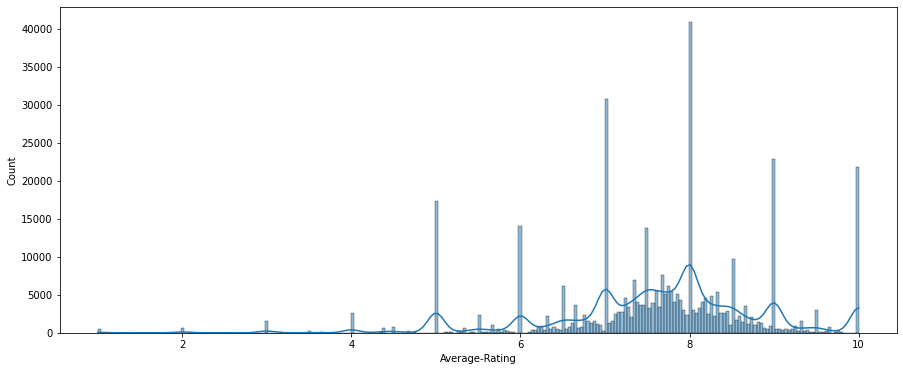

In [67]:
# plot the distribution of average rating
plt.figure(figsize=(15,6))
sns.histplot(data=data, x='Average-Rating',kde=True)

#####***Analysis of number of ratings***

* **Country**

In [68]:
# group data by "Country" and count the number of ratings per group
country_rating = data.groupby(['Country'])['Book-Rating'].count().reset_index().sort_values(by = 'Book-Rating', ascending = False)[:5]
country_rating.head(5)

,Country,Book-Rating
319,usa,261775
54,canada,35531
342,Other,17576
307,united kingdom,14409
109,germany,12149


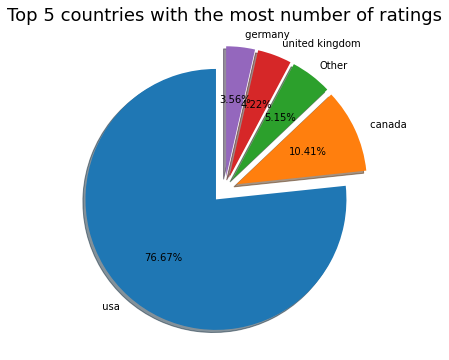

In [69]:
# plot the top 5 countries with the most number of ratings using pie-chart
plt.rcParams['figure.figsize'] = (10,6)
r = country_rating['Book-Rating'][:5]
plt.pie(r, labels = country_rating['Country'], autopct ='%0.2f%%', startangle =90, explode = [0.1,0.1,0.1,0.1,0.1], shadow = True )
plt.title('Top 5 countries with the most number of ratings', {'fontsize': 18})
plt.show()

* **Country, State**

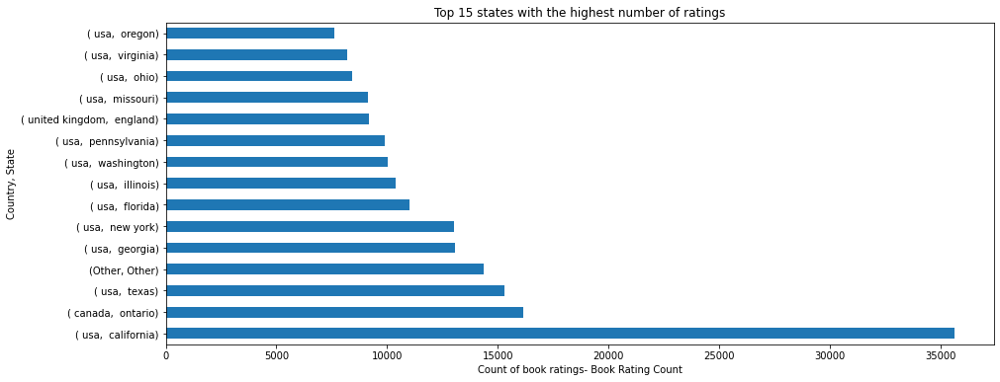

In [70]:
# group the data based on "Country" and "States" and plot the number of book ratings arranged in decreasing fashion
data.groupby(['Country', 'State'])['Book-Rating'].count().sort_values(ascending=False)[:15].plot.barh(figsize=(15,6))
plt.xlabel('Count of book ratings- Book Rating Count')
plt.ylabel('Country, State')
plt.title('Top 15 states with the highest number of ratings');

* **Book-Authors** 

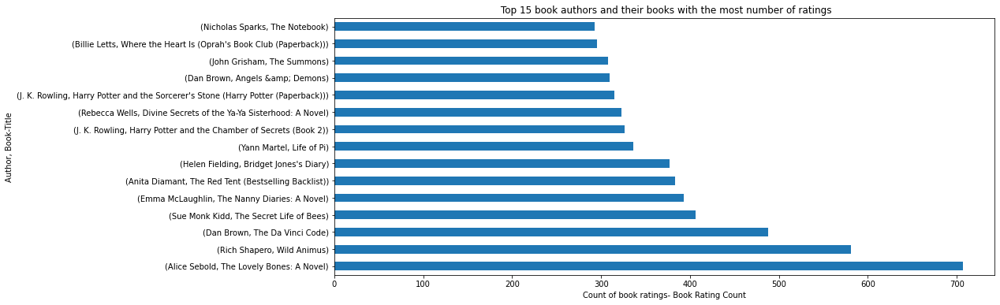

In [71]:
# group the data based on Book-Author and Book-Title and obtain the book ratings arranged in decreasing fashion
data.groupby([ 'Book-Author','Book-Title'])['Book-Rating'].count().sort_values(ascending=False)[:15].plot.barh(figsize=(15,6))
plt.xlabel('Count of book ratings- Book Rating Count')
plt.ylabel('Author, Book-Title')
plt.title(' Top 15 book authors and their books with the most number of ratings');

* **Publisher, Book-Author**

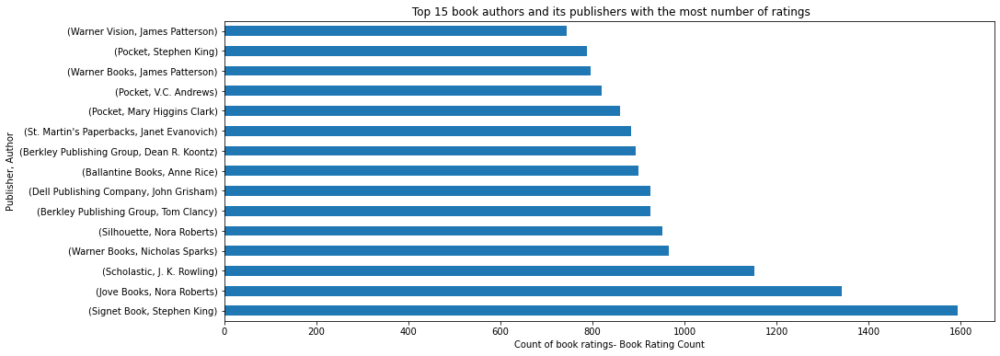

In [72]:
# group the data based on "Publisher" and "Book-Authors" and plot the number of book ratings arranged in decreasing fashion
data.groupby(['Publisher', 'Book-Author'])['Book-Rating'].count().sort_values(ascending=False)[:15].plot.barh(figsize=(15,6))
plt.xlabel('Count of book ratings- Book Rating Count')
plt.ylabel('Publisher, Author')
plt.title(' Top 15 book authors and its publishers with the most number of ratings');

**Hypotheses/Observations drawn from exploratory data analysis**


* ***Agatha Christie, William Shakespeare, and Stephen King*** are the authors with the most number of books being published. Therefore, these authors could be recommended based on most books being published.
* ***1996, 2002, and 1999*** mark the years with the most number of books published.
* ***Harlequin, Silhouette, and Pocket*** have published the most number of books. 
* The mean average rating of the books is around **8**, and the distribution is left-skewed.
* ***USA (California, Texas), Canada(Ontario), Uk, and Germany*** host the largest number of book publications and have obtained a large number of ratings as well.
* ***The Lovely Bones: A Novel by Alice Sebold, Wild Animus by Rich Shapero, and The Da Vinci Code by Dan Brown*** are the books that are among the highest-rated ones. These could be the most popular ones among the wide range of users.
* ***Stephen King, Nora Roberts, and J.K.Rowling*** are the authors with the most ratings. Hence, these authors’ works can be recommended to any new user.

## ***Recommenders***


### ***Data***

In [73]:
data

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-L,User-ID,Book-Rating,Country,State,Average-Rating,Book-Rating-Count
0,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg,8,5,canada,ontario,7.666667,9
1,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg,11676,8,Other,Other,7.666667,9
2,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg,67544,8,canada,ontario,7.666667,9
3,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg,116866,9,Other,Other,7.666667,9
4,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg,123629,9,canada,ontario,7.666667,9
...,...,...,...,...,...,...,...,...,...,...,...,...
383837,8441407487,Sobre La Utilidad y Los Perjuicios de La Historia,Friedrich Wilhelm Nietzsche,2000.0,Edaf,http://images.amazon.com/images/P/8441407487.01.LZZZZZZZ.jpg,246590,6,spain,madrid,6.000000,1
383838,087004124X,Anthem,Ayn Rand,1966.0,Caxton Press,http://images.amazon.com/images/P/087004124X.01.LZZZZZZZ.jpg,259589,8,usa,florida,8.000000,1
383839,158243123X,A Student of Weather,Elizabeth Hay,2001.0,Counterpoint Press,http://images.amazon.com/images/P/158243123X.01.LZZZZZZZ.jpg,259591,8,usa,pennsylvania,8.000000,1
383840,8485900057,Rimas y leyendas (ClÃ¡sicos Fraile ; 3),Gustavo Adolfo BÃ©cquer,1981.0,Ediciones Fraile,http://images.amazon.com/images/P/8485900057.01.LZZZZZZZ.jpg,259614,10,spain,madrid,10.000000,1


In [74]:
data.shape

(383842, 12)

###  ***1. Recommendation System: Popularity***

It is a type of recommendation system which works on the principle of popularity and or anything which is in trend. Popularity in this case is defined as high average rating given that the the number of book ratings are above the defined popularity threshold.
* Average rating is obtained for each book by averaging all the ratings given to the book by different users.
* The defined recommender requires the popularity threshold, that indicates the minimum number of ratings( Book-Rating-Count) of the book, for it to be considered for popularity evaluation. 
* The books that have higher count of book ratings than the threshold expected, are arranged in the decreasing fashion of average rating of the book. And the topmost books are recommended.

* Popularity based recommenders give generic recommendations, irrepective of the interests and preferences/history of users.

* Popular recommendations are made using certain statements like, trending, best-selling, new arrivals, frequently purchased etc.

In [75]:
# recommend the books based on average rating of the books
def popularity_based_recommender(dataframe, threshold, num_recommendations):

      ''' function to recommend books based on the popularity defined using average rating of each book.
      parameters: 
          dataframe- data, 
          threshold- a cutoff defined to consider the data above the defined thresholld value,
          num_recommendations- number of books to be recommended '''

      # define popularity threshold to consider books of ratings count higher than this.
      popularity_threshold = threshold             # A book is considered for recommendation if it has more votes than popularity threshold.

      # define dataframe containing the books with raings count higher than the threshold.
      most_rated=dataframe[dataframe['Book-Rating-Count'] >= popularity_threshold]
      # group the data by Book-Title and sort based on Average Rating
      result= most_rated.groupby('Book-Title', as_index=False).first().sort_values(by='Average-Rating',ascending=False).head(num_recommendations)

      show_books(result)
      result=result[['Book-Title', 'Book-Author','Publisher', 'Average-Rating','Book-Rating-Count']].reset_index(drop=True) 
      print("The recommendations based on popularity are as follows")

      return result


The recommendations based on popularity are as follows


,Book-Title,Book-Author,Publisher,Average-Rating,Book-Rating-Count
0,Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback)),J. K. Rowling,Arthur A. Levine Books,8.939297,313
1,The Secret Life of Bees,Sue Monk Kidd,Penguin Books,8.452769,307
2,The Da Vinci Code,Dan Brown,Doubleday,8.435318,487
3,The Lovely Bones: A Novel,Alice Sebold,"Little, Brown",8.185290,707
4,The Red Tent (Bestselling Backlist),Anita Diamant,Picador USA,8.182768,383


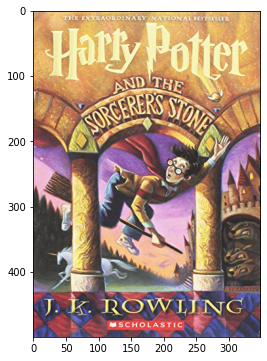

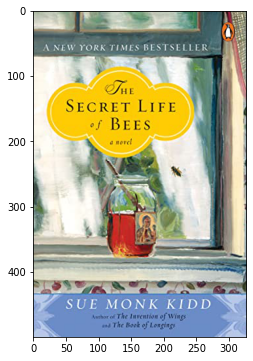

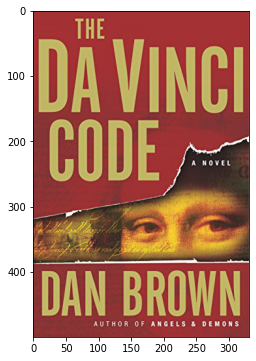

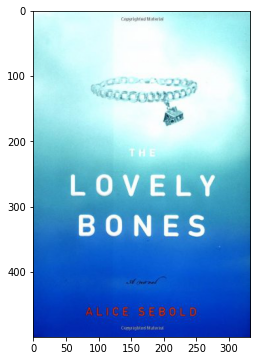

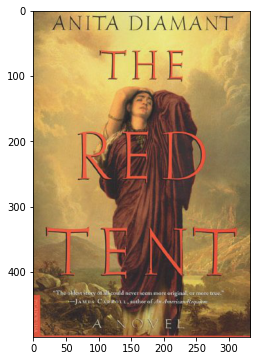

In [76]:
# function call to obtain 5 recommendations with number of book ratings above 300( book-rating-count)
popularity_based_recommender(data,300,5)


The recommendations based on popularity are as follows


,Book-Title,Book-Author,Publisher,Average-Rating,Book-Rating-Count
0,The Da Vinci Code,Dan Brown,Doubleday,8.435318,487
1,The Lovely Bones: A Novel,Alice Sebold,"Little, Brown",8.185290,707
2,Wild Animus,Rich Shapero,Too Far,4.390706,581


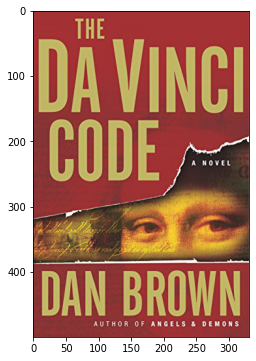

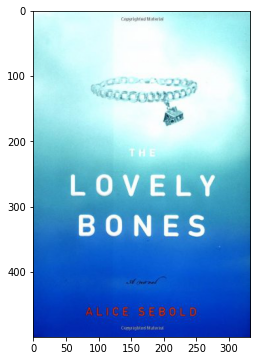

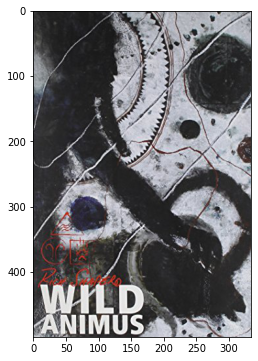

In [77]:
# function call to obtain 5 recommendations with number of book ratings above 250( book-rating-count)
popularity_based_recommender(data,400,5)
# only three books satisfy the criteria of popularity threshold

###  ***2. Recommendation System: Weighted Average*** 

Weighted Average is Calculated using the formula as described below:

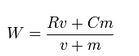

Where, 

W= Weighted Average

v= number of ratings for the book- [Book-Rating-Count ]

m= the minimum number of ratings required to be listed in the chart- [Threshold]

R= the average rating of the book -[Average Rating]

C= the mean average ratings across the whole dataset- [mean(Average-Rating)]

In [78]:
# define the weighted average recommender
def weighted_average_recommender(dataframe,num_recommendations):
  '''function to recommend books based on the defined formula to calculate weighted average of each book.
      parameters: 
          dataframe- data, 
          num_recommendations- number of books to be recommended'''


  # define the variables required to calculate the weighted average
  v=dataframe['Book-Rating-Count']
  R=dataframe['Average-Rating']
  C=dataframe['Average-Rating'].mean()
  m=dataframe['Book-Rating-Count'].quantile(0.90)
  # 90th percentile is used as the threshold/cutoff. A book is considered for recommendation if it has more votes than atleast 90% of the books in the dataset.

  dataframe['Weighted-Average-Score']=  ((R*v)+ (C*m))/(v+m)      # define the weighted average 

  #consider the frame of data that has rating count above cutoff percentile
  top_dataframe= dataframe.loc[data['Book-Rating-Count'] >= m]    

  # sort the obtained books based on decreasing order of weighted average and extract top 'num_recommendations' recommedations 
  dataframe= top_dataframe.groupby('Book-Title', as_index=False).first().sort_values(by='Weighted-Average-Score',ascending=False).head(num_recommendations)
  
  show_books(dataframe)
  dataframe=dataframe[['Book-Title', 'Book-Author','Publisher','Average-Rating','Book-Rating-Count', 'Weighted-Average-Score']].reset_index(drop=True) 
  print("The recommendations based on weighted average are as follows")

  return dataframe



The recommendations based on weighted average are as follows


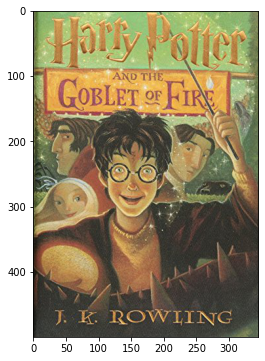

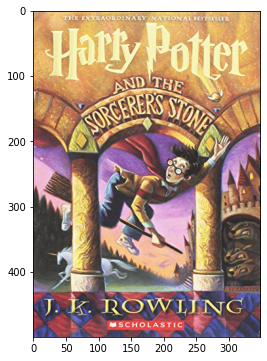

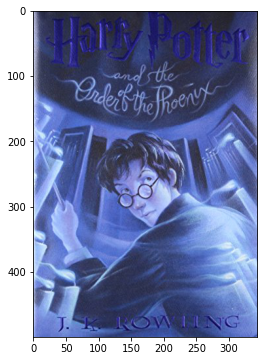

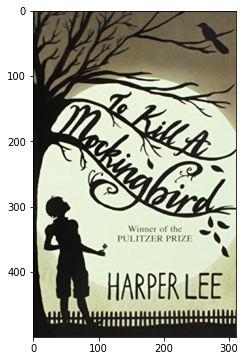

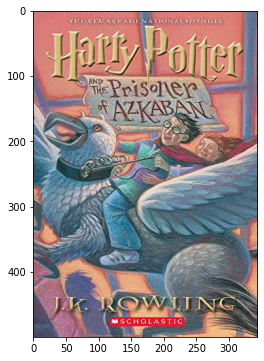

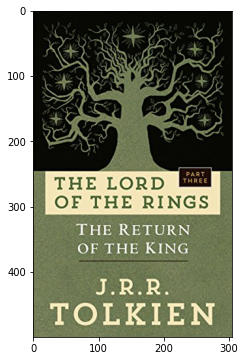

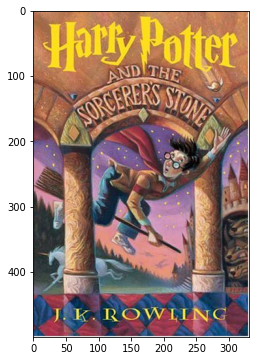

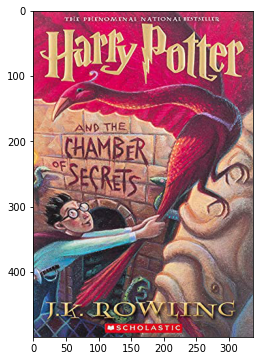

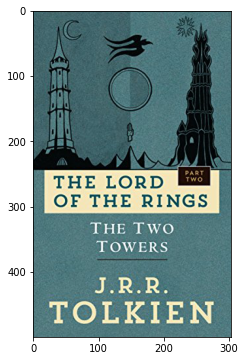

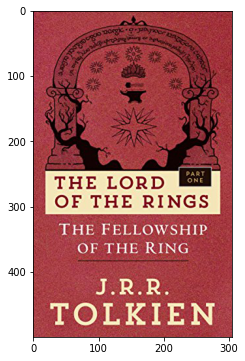

In [79]:
# function call to obtain 10 recommendations based on weighted average 
weighted_recommender_result=weighted_average_recommender(data,10)

In [80]:
weighted_recommender_result

,Book-Title,Book-Author,Publisher,Average-Rating,Book-Rating-Count,Weighted-Average-Score
0,Harry Potter and the Goblet of Fire (Book 4),J. K. Rowling,Scholastic,9.262774,137,8.741835
1,Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback)),J. K. Rowling,Arthur A. Levine Books,8.939297,313,8.716469
2,Harry Potter and the Order of the Phoenix (Book 5),J. K. Rowling,Scholastic,9.033981,206,8.700403
3,To Kill a Mockingbird,Harper Lee,Little Brown &amp; Company,8.943925,214,8.640679
4,Harry Potter and the Prisoner of Azkaban (Book 3),J. K. Rowling,Scholastic,9.082707,133,8.609690
5,"The Return of the King (The Lord of the Rings, Part 3)",J.R.R. TOLKIEN,Del Rey,9.402597,77,8.596517
6,Harry Potter and the Sorcerer's Stone (Book 1),J. K. Rowling,Scholastic,8.983193,119,8.508791
7,Harry Potter and the Chamber of Secrets (Book 2),J. K. Rowling,Scholastic,8.783069,189,8.490549
8,"The Two Towers (The Lord of the Rings, Part 2)",J.R.R. TOLKIEN,Del Rey,9.120482,83,8.470128
9,"The Fellowship of the Ring (The Lord of the Rings, Part 1)",J.R.R. TOLKIEN,Del Rey,8.839695,131,8.441584


Plotting the weighted average score for top 10 recommended books

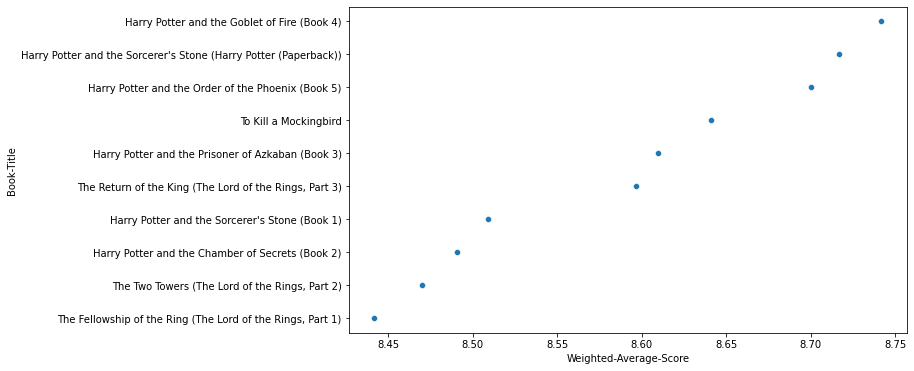

In [81]:
sns.scatterplot(x=weighted_recommender_result['Weighted-Average-Score'], y=weighted_recommender_result['Book-Title'], data=weighted_recommender_result)

### ***3. Recommendation System: Collaborative Filtering*** 

The Collaborative Filtering Recommender is entirely based on the past behavior and not on the context. More specifically, it is based on the similarity in preferences, tastes and choices of two users. It analyses how similar the tastes of one user is to another and makes recommendations on the basis of that.

The underlying assumption of the collaborative filtering approach is that if A and B buy similar products, A is more likely to buy a product that B has bought than a product which a random person has bought. Unlike content based, there are no features corresponding to users or items here. All we have is the Utility Matrix.

In a basic sense, we can say that it is a way to find similarities between users and items. Utilizing it we can calculate ratings based on ratings of similar users or similar items. 

In general, collaborative filtering is the workhorse of recommender engines. The algorithm has a very interesting property of being able to do feature learning on its own, which means that it can start to learn for itself what features to use. It can be divided into Memory-Based Collaborative Filtering and Model-Based Collaborative filtering.

 

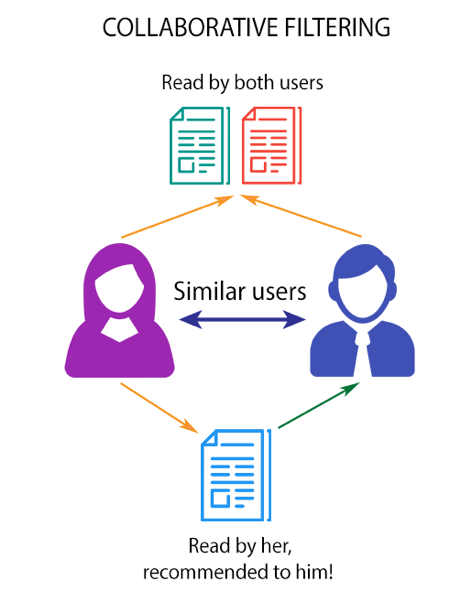

#### ***Data Preparation***

In [82]:
data.head(3)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-L,User-ID,Book-Rating,Country,State,Average-Rating,Book-Rating-Count,Weighted-Average-Score
0,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg,8,5,canada,ontario,7.666667,9,7.631628
1,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg,11676,8,Other,Other,7.666667,9,7.631628
2,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.01.LZZZZZZZ.jpg,67544,8,canada,ontario,7.666667,9,7.631628


In [83]:
data.shape

(383842, 13)

Data Filtering 

In [84]:
user_threshold= 60  # minimum number of books to be rated by the user
ratings_threshold=10  # minimum number of ratings to be obtained by the book

Consider the users who have rated at least 60 books and books with atleast 10 ratings for the sake of statistical significance and to avoid running into memory error.

In [85]:
temp=data.groupby('User-ID').count()['Book-Rating']>user_threshold
users_gave_highratings=temp[temp].index
# users_gave_highratings contains ratings of users who have rated more than 60 books.


In [86]:
filtered_users=data[data['User-ID'].isin(users_gave_highratings)]
# filtered_users contains statistically significant users information (users that have rating more than 60 books)

In [87]:
temp=filtered_users.groupby('Book-Title').count()['Book-Rating']>ratings_threshold
high_rated_books=temp[temp].index
# high_rated_books contains ratings of books that are rated by more than 10 users.

In [88]:
final_filtered_data=filtered_users[filtered_users['Book-Title'].isin(high_rated_books)]
# final_filtered_data contains statistically significant information 

In [89]:
tmp=final_filtered_data['User-ID']==1424
tmp[tmp].index
#verifying

Int64Index([ 15866,  22795,  27547,  50799,  57097,  95888, 101594, 101763,
            111934, 128229, 130874],
           dtype='int64')

In [90]:
# check for any duplicates in the final filtered data
final_filtered_data.duplicated().sum()

0

In [91]:
final_filtered_data.shape

(24979, 13)

In [92]:
final_filtered_data.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-L,User-ID,Book-Rating,Country,State,Average-Rating,Book-Rating-Count,Weighted-Average-Score
16,0399135782,The Kitchen God's Wife,Amy Tan,1991.0,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.01.LZZZZZZZ.jpg,11676,9,Other,Other,8.176471,17,7.742084
17,0399135782,The Kitchen God's Wife,Amy Tan,1991.0,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.01.LZZZZZZZ.jpg,29526,9,usa,tennessee,8.176471,17,7.742084
18,0399135782,The Kitchen God's Wife,Amy Tan,1991.0,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.01.LZZZZZZZ.jpg,46398,9,usa,texas,8.176471,17,7.742084
28,0399135782,The Kitchen God's Wife,Amy Tan,1991.0,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.01.LZZZZZZZ.jpg,230522,7,usa,colorado,8.176471,17,7.742084
30,0399135782,The Kitchen God's Wife,Amy Tan,1991.0,Putnam Pub Group,http://images.amazon.com/images/P/0399135782.01.LZZZZZZZ.jpg,245827,9,Other,Other,8.176471,17,7.742084


* Dataframe "final_filtered_data" is used for collaborative filtering models

#### ***3a. Collaborative Filtering: Memory Based***

For the memory based approach, the utility matrix is memorized and recommendations are made by querying the given user/item with the rest of the utility matrix. 

Similarity between users/items  can be computed using any methods like cosine similarity/Jaccard similarity/Pearson’s correlation coefficient, etc. 
Cosine Similarity is explored in this case:
The ultimate reason behind using cosine is that the value of cosine will increase with decreasing value of the angle between which signifies more similarity.

* Similarity is the cosine of the angle between the two vectors of the item vectors of A and B
* Closer the vectors, smaller will be the angle and larger the cosine

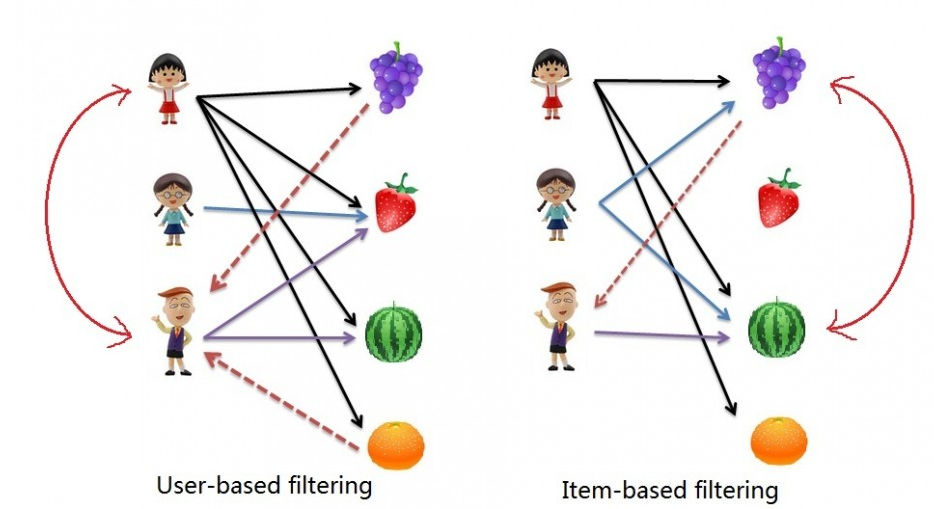

Memory Based Collaborative Filtering 

There are 2 main types of memory-based collaborative filtering algorithms:

* User-User Collaborative Filtering 
* Item-Item Collaborative Filtering 

Item-Item Filtering is implemented in this problem statement.

Item-Item Collaborative Filtering:
Unlike finding user's look-alike as in User-User collaborative filtering item's(books) look-alikes are found and recommended. This type of recommendation system helps in finding similarities between the items or products. Once the books similarity matrix is found, similar books can be recommended to users who have rated any book from the dataset. 

This algorithm is far less resource consuming than user-user collaborative filtering. Hence, for a new user, the algorithm takes far lesser time than user-user collaborate as we don’t need all similarity scores between users. And with fixed number of books, book-book similarity matrix is fixed over time.

* **Pivot table** is a utility table that has index, columns and values.
* It can be formatted to use for calculating similarity/correlation. As the similarity will be higher we can use them as our recommendation.
* It is a sparse table.

In [93]:
# define the pivot table with index as book titles, userids as columns and book ratings as the values of the table.
pt_table= final_filtered_data.pivot_table(index='Book-Title',columns=['User-ID'],values='Book-Rating')

In [94]:
# if the user hasn't rated the particular book, it contains NaN as the value. So, replace them with 0 values.
pt_table.fillna(0,inplace=True)
pt_table

User-ID,1424,1733,2033,2110,2276,2766,2977,3363,3757,3827,...,273113,273718,274004,274061,274111,274301,275970,276680,277427,278418
Book-Title,,,,,,,,,,,,,,,,,,,,,
1984,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1st to Die: A Novel,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010: Odyssey Two,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2061: Odyssey Three,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2nd Chance,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
You Belong To Me,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
You Belong to Me,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0
Yukon Ho!,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


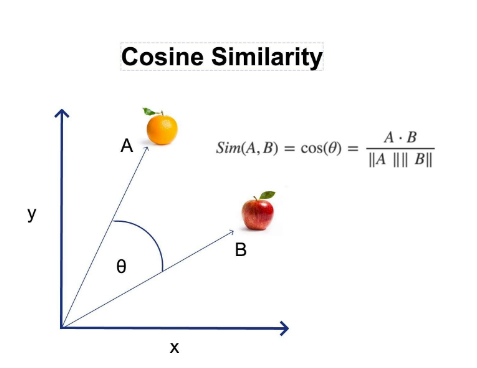

In [95]:
from sklearn.metrics.pairwise import cosine_similarity
# cosine_similarity finds the similarity between each book in the index with every other book.
similarity_scores= cosine_similarity(pt_table)
similarity_scores.shape
# The shape of the similarity scores is (n,n) where n is the number of rows(# books)

(1254, 1254)

In [96]:
print(similarity_scores)
# similarity scores lie between 0 and 1

[[1.         0.09167568 0.03303029 ... 0.08063453 0.11044389 0.06198521]
 [0.09167568 1.         0.02273959 ... 0.07922107 0.05483273 0.107878  ]
 [0.03303029 0.02273959 1.         ... 0.         0.09614567 0.        ]
 ...
 [0.08063453 0.07922107 0.         ... 1.         0.06161234 0.05367508]
 [0.11044389 0.05483273 0.09614567 ... 0.06161234 1.         0.03298882]
 [0.06198521 0.107878   0.         ... 0.05367508 0.03298882 1.        ]]


In [97]:
unique_final_filtered_data=final_filtered_data.groupby('Book-Title').first().reset_index()
# obtain the unique books by considering the firsts of every group based on book-title

In [98]:
unique_final_filtered_data.shape

(1254, 13)

In [99]:
unique_final_filtered_data.head()

,Book-Title,ISBN,Book-Author,Year-Of-Publication,Publisher,Image-URL-L,User-ID,Book-Rating,Country,State,Average-Rating,Book-Rating-Count,Weighted-Average-Score
0,1984,0452262933,George Orwell,1983.0,Plume Books,http://images.amazon.com/images/P/0452262933.01.LZZZZZZZ.jpg,11676,10,Other,Other,8.727273,11,7.788118
1,1st to Die: A Novel,0446610038,James Patterson,2002.0,Warner Vision,http://images.amazon.com/images/P/0446610038.01.LZZZZZZZ.jpg,11676,10,Other,Other,7.728814,177,7.701696
2,2010: Odyssey Two,0345303067,Arthur C. Clarke,1984.0,Del Rey Books,http://images.amazon.com/images/P/0345303067.01.LZZZZZZZ.jpg,165319,6,usa,arizona,7.413793,29,7.560310
3,2061: Odyssey Three,0345358791,Arthur C. Clarke,1991.0,Del Rey Books,http://images.amazon.com/images/P/0345358791.01.LZZZZZZZ.jpg,38023,9,usa,california,7.666667,18,7.635474
4,2nd Chance,0316693200,James Patterson,2002.0,"Little, Brown",http://images.amazon.com/images/P/0316693200.01.LZZZZZZZ.jpg,11676,7,Other,Other,7.847458,59,7.732592


In [100]:
def collaborative_memory_based(book_name,num_recommendations):
  ''' Given the book name, provides us with the n similar book recommendations based on similarity scores obtained from utility matrix
  parameters:
        book_name- book-title similar to which the books are to be recommended
        num_recommendations- number of books similar to book_name to be recommended'''

  # spot the book in the pivot table and get the index      
  index=np.where(pt_table.index==book_name)[0][0]
  # get the indices of num_recommendations similar books (based on similarity score), sort the list based on the similarity scores and arrange in decreasing fashion.
  similar_indices=sorted(list(enumerate(similarity_scores[index])),key=lambda x:x[1],reverse=True)[1:num_recommendations+1]
  # similar_indices store the list of tuples of the format (index, similarity score) 
  temp=pd.DataFrame()

  for book in similar_indices:
    book_title=pt_table.index[book[0]] # obtain book-title using the index value
    temp=pd.concat([temp,unique_final_filtered_data.loc[unique_final_filtered_data['Book-Title'] == book_title]]) # locate the book from the data
    temp['Similarity-Score']= book[1]
  print("The recommendations based on memory-based collaborative filtering are as follows")


  show_books(temp)
  return temp[['Book-Title', 'Book-Author','Publisher','Average-Rating','Book-Rating-Count', 'Similarity-Score']].reset_index(drop=True)


The recommendations based on memory-based collaborative filtering are as follows


,Book-Title,Book-Author,Publisher,Average-Rating,Book-Rating-Count,Similarity-Score
0,Harry Potter and the Prisoner of Azkaban (Book 3),J. K. Rowling,Scholastic,9.082707,133,0.365923
1,Harry Potter and the Chamber of Secrets (Book 2),J. K. Rowling,Scholastic,8.783069,189,0.365923
2,Harry Potter and the Order of the Phoenix (Book 5),J. K. Rowling,Scholastic,9.033981,206,0.365923
3,Harry Potter and the Sorcerer's Stone (Book 1),J. K. Rowling,Scholastic,8.983193,119,0.365923
4,Harry Potter and the Sorcerer's Stone (Harry Potter (Paperback)),J. K. Rowling,Arthur A. Levine Books,8.939297,313,0.365923


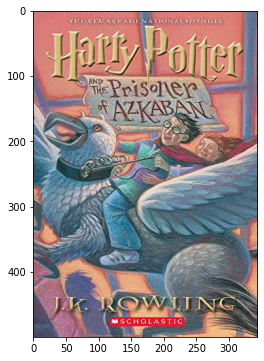

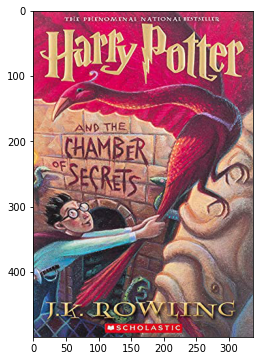

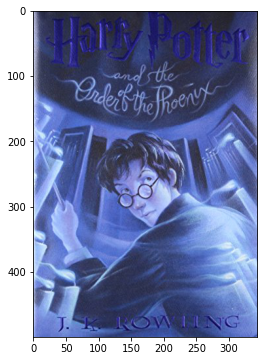

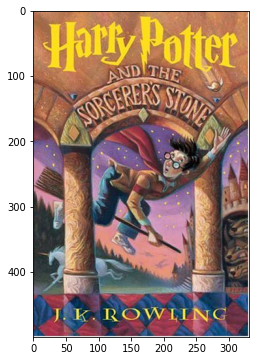

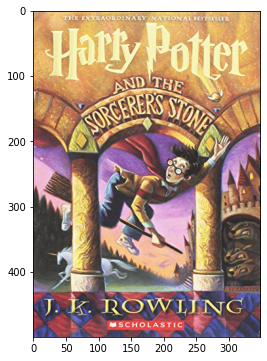

In [101]:
# given the preference of user as "Harry Potter and the Goblet of Fire", similar books are recommended as:
collaborative_memory_based('Harry Potter and the Goblet of Fire (Book 4)',5)

The recommendations based on memory-based collaborative filtering are as follows


,Book-Title,Book-Author,Publisher,Average-Rating,Book-Rating-Count,Similarity-Score
0,Animal Farm,George Orwell,Signet,8.369565,92,0.223404
1,Brave New World,Aldous Huxley,Harpercollins,8.266667,30,0.223404
2,The Handmaid's Tale,Margaret Atwood,Fawcett Books,8.495495,111,0.223404
3,Naked,David Sedaris,Little Brown &amp; Co,7.718750,32,0.223404
4,"Roll of Thunder, Hear My Cry",Mildred D. Taylor,Puffin Books,8.125000,16,0.223404


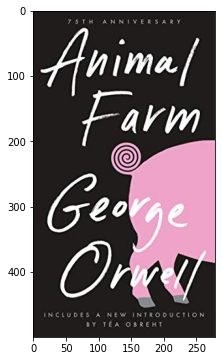

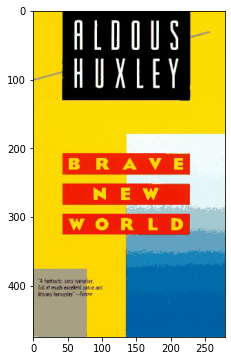

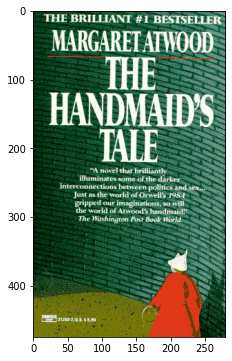

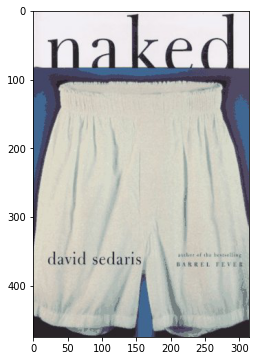

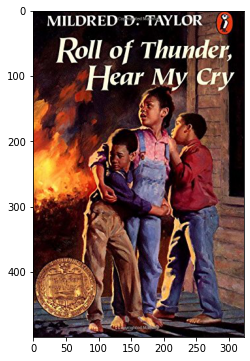

In [102]:
collaborative_memory_based('1984',5)

The recommendations based on memory-based collaborative filtering are as follows


,Book-Title,Book-Author,Publisher,Average-Rating,Book-Rating-Count,Similarity-Score
0,"The Two Towers (The Lord of the Rings, Part 2)",J. R. R. Tolkien,Houghton Mifflin,9.500000,4,0.260915
1,"The Return of the King (The Lord of the Rings, Part 3)",J. R. R. Tolkien,Houghton Mifflin,9.750000,4,0.260915
2,Harry Potter and the Goblet of Fire (Book 4),J. K. Rowling,Scholastic,9.262774,137,0.260915
3,Harry Potter and the Chamber of Secrets (Book 2),J. K. Rowling,Scholastic,8.783069,189,0.260915
4,The Hobbit : The Enchanting Prelude to The Lord of the Rings,J.R.R. TOLKIEN,Del Rey,8.739130,161,0.260915


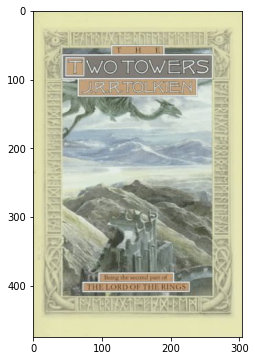

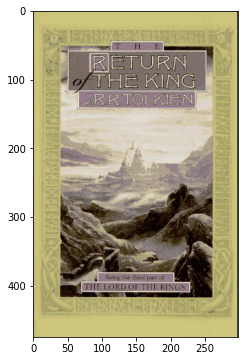

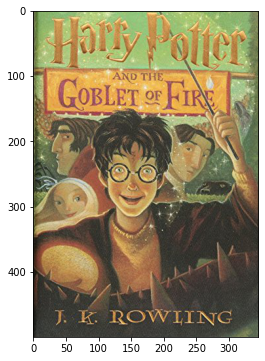

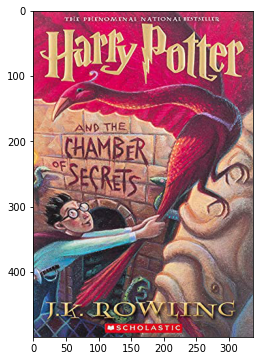

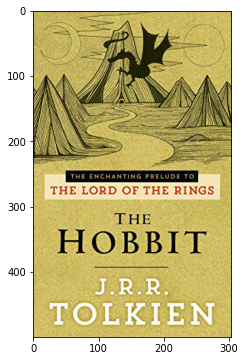

In [103]:
collaborative_memory_based('The Fellowship of the Ring (The Lord of the Rings, Part 1)',5)

The recommendations based on memory-based collaborative filtering are as follows


,Book-Title,Book-Author,Publisher,Average-Rating,Book-Rating-Count,Similarity-Score
0,"The Two Towers (The Lord of the Rings, Part 2)",J. R. R. Tolkien,Houghton Mifflin,9.500000,4,0.176392
1,"The Fellowship of the Ring (The Lord of the Rings, Part 1)",J. R. R. Tolkien,Houghton Mifflin Company,9.093023,43,0.176392
2,"The Return of the King (The Lord of the Rings, Part 3)",J. R. R. Tolkien,Houghton Mifflin,9.750000,4,0.176392
3,The English Patient,Michael Ondaatje,Vintage Books USA,7.433333,90,0.176392
4,Where the Red Fern Grows,Wilson Rawls,Random House Children's Books,8.666667,57,0.176392


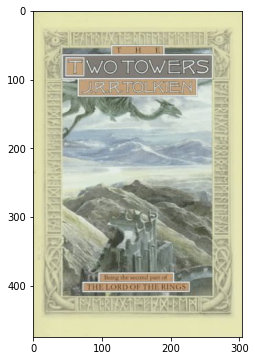

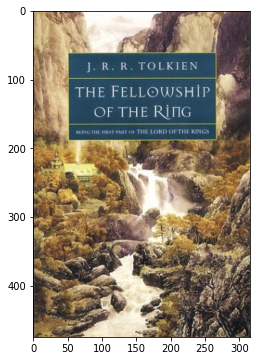

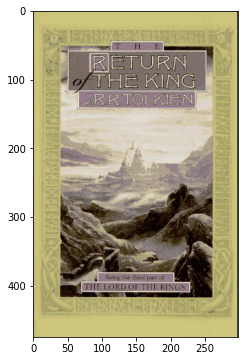

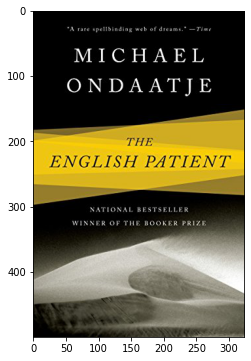

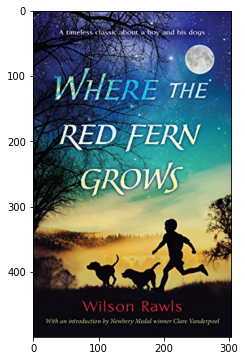

In [104]:
collaborative_memory_based('The Hobbit : The Enchanting Prelude to The Lord of the Rings',5)

#### ***3b. Collaborative Filtering: Model Based***

Model based approach:

Memory-based collaborative filtering approaches that compute distance relationships between items or users have these two major issues:

* It doesn't scale particularly well to massive datasets, especially for real-time recommendations based on user behavior similarities - which takes a lot of computations.

* Rating matrices may be overfitting to noisy representations of user tastes and preferences. When we use distance based "neighborhood" approaches on raw data, we match to sparse low-level details that we assume represent the user's preference vector instead of the vector itself.

Therefore dimensionality Reduction techniques are used to derive the tastes and preferences from the raw data, otherwise known as doing low-rank matrix factorization. 
* Perhaps the more popular technique for dimensionality reduction in machine learning is Singular Value Decomposition, or SVD for short. This is a technique that comes from the field of linear algebra and can be used as a data preparation technique to create a projection of a sparse dataset prior to fitting a model.



This work focuses on the matrix factorization using SVD(**Singular Value Decomposition**).

* The Singular Value Decomposition (SVD), a method from linear algebra that has been generally used as a dimensionality reduction technique in machine learning. 
* SVD is a matrix factorisation technique, which reduces the number of features of a dataset by reducing the space dimension from N-dimension to K-dimension (where K<N). 
* It uses a matrix structure(Pivot-Table) where each row represents a user, and each column represents an item. The elements of this matrix are the ratings that are given to items by users.

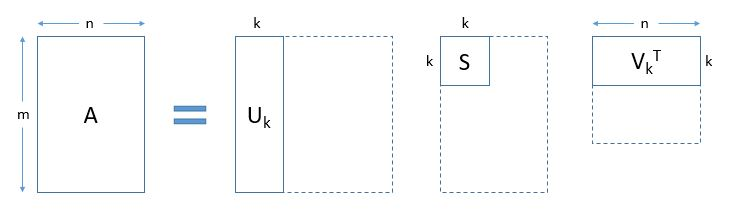

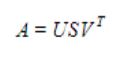



Where,

* A is a m x n utility matrix, 

* U is a m x k orthogonal left singular matrix, which represents the relationship between users and latent factors, 

* S is a k x k diagonal matrix, which describes the strength of each latent factor.

* V is a k x n diagonal right singular matrix, which indicates the similarity between items and latent factors. 

SVD decomposes a matrix A into the best lower rank approximation of the original matrix . Mathematically, it decomposes A into a two unitary matrices and a diagonal matrix

To get the lower rank approximation, We take these matrices and keep only the top k features, which can be thought of as the underlying tastes and preferences vectors.

In [105]:
# extract the values of the pivot table into a matrix
pt_table_matrix = pt_table.values
pt_table_matrix.shape

(1254, 908)

In [106]:
from scipy.sparse.linalg import svds


In [107]:
# the number of factors to factor the user-item matrix.
NUMBER_OF_FACTORS_MF = 15

# perform matrix factorization of the original user item matrix
U, sigma, Vt = svds(pt_table_matrix, k = NUMBER_OF_FACTORS_MF)

In [108]:
U.shape

(1254, 15)

In [109]:
sigma = np.diag(sigma)
sigma.shape

(15, 15)

In [110]:
Vt.shape

(15, 908)

To make book ratings predictions for every user, we need to matrix multiply U, sigma and VT to get the rank k=15 approximation of A.

In [111]:
# obtain the approximate matrix of rank K by multiplying the matrices: This becomes the prediction matrix.
books_final_ratings = np.dot(np.dot(U, sigma), Vt) 
books_final_ratings

array([[ 0.15324958, -0.24076924, -0.18558704, ...,  0.15483879,
         0.77547794, -0.00982714],
       [ 0.0902947 , -0.00849582,  0.00431744, ...,  0.15050566,
         0.7929546 , -0.03927854],
       [ 0.04853734,  0.02060352,  0.1142407 , ..., -0.06726232,
         0.12711058,  0.10362569],
       ...,
       [-0.01304882,  0.03170623,  0.27981099, ..., -0.0301208 ,
         0.0603881 ,  0.0560268 ],
       [ 0.1234499 ,  0.06039605,  0.1608019 , ...,  0.11360594,
         0.14796341,  0.14260674],
       [ 0.03913896,  0.14653715,  0.12028242, ..., -0.21034852,
         0.06523447,  0.02773813]])

In [112]:
books_final_ratings.shape

(1254, 908)

In [113]:
# obtain the book titles from the pivot-table index
book_titles = list(pt_table.index)
book_titles[:10]

['1984',
 '1st to Die: A Novel',
 '2010: Odyssey Two',
 '2061: Odyssey Three',
 '2nd Chance',
 '4 Blondes',
 '84 Charing Cross Road',
 'A Beautiful Mind: The Life of Mathematical Genius and Nobel Laureate John Nash',
 'A Bend in the Road',
 'A Caress of Twilight (Meredith Gentry Novels (Hardcover))']

In [114]:
#Converting the reconstructed matrix back to a Pandas dataframe
ratings_predicted = pd.DataFrame(books_final_ratings, columns = pt_table.columns, index=book_titles)
ratings_predicted.head()

User-ID,1424,1733,2033,2110,2276,2766,2977,3363,3757,3827,...,273113,273718,274004,274061,274111,274301,275970,276680,277427,278418
1984,0.153250,-0.240769,-0.185587,0.113552,0.241036,0.357099,0.033364,0.167494,0.069356,0.407277,...,-0.491818,0.217939,0.408531,0.800706,0.047601,-0.733173,0.301222,0.154839,0.775478,-0.009827
1st to Die: A Novel,0.090295,-0.008496,0.004317,0.144965,0.771409,0.132766,0.063677,0.159348,-0.020168,-0.332245,...,-0.503508,0.181561,0.240645,-2.077923,-0.045336,2.196948,-0.198164,0.150506,0.792955,-0.039279
2010: Odyssey Two,0.048537,0.020604,0.114241,0.101874,0.010352,0.090639,-0.004244,0.005364,0.008671,0.100044,...,0.943716,0.086093,0.112221,0.923214,0.050325,-0.262515,-0.006784,-0.067262,0.127111,0.103626
2061: Odyssey Three,-0.007707,-0.020564,0.226458,0.053783,0.083649,-0.036419,-0.009697,-0.061370,0.031899,0.135732,...,-0.112366,0.012078,0.142342,0.698250,0.011524,0.095132,0.055585,-0.048436,0.105857,-0.013191
2nd Chance,-0.023348,0.179891,-0.051017,0.064637,1.259868,-0.231334,-0.005005,-0.140524,-0.004074,0.024608,...,0.040391,0.147367,0.610772,-0.515167,-0.023372,1.059755,-0.210568,0.528800,0.509629,-0.080095


In [115]:
def collaborative_model_based(predictions, userID, dataframe, num_recommendations):
  ''' Given the prediction matrix, user id, data and number of recommendations, the function returns the top num_recommendations suitable for the given userid based on the prediction 
  values in the matrix. It also gived the data related to the books that the specified user has rated before.
  parameters:
      predictions- the reconstructed matrix of rank k, converted to dataframe that consists of the predicted ratings of each book by all users,
      userID- the userID for whom the books are to be predicted using the algorithm defined,
      dataframe- the filtered dataset to consider users and books above certain ratings,
      num_recommendations- number of books to be recommended for the user.'''
    
  # Get and sort the user's predictions from the prediction dataframe 
  sorted_user_predictions = predictions[userID].sort_values(ascending=False).reset_index().rename(columns={'index':'Book-Title',userID:'Predicted-Rating'}) 

  # Get the user's data which the user has interected/rated before. It contains the info regarding the books that are rated by the user.
  user_data=dataframe[dataframe['User-ID']==userID]
  print ('User {0} has already rated {1} movies.'.format(userID, user_data.shape[0]))
  print ('Recommending highest {0} predicted ratings books that are not already rated by the user.'.format(num_recommendations))

    
  # Recommend the highest predicted rating books that the user hasn't seen/interacted with yet.
  recommendations = (dataframe[~dataframe['Book-Title'].isin(user_data['Book-Title'])]).merge(sorted_user_predictions,on = 'Book-Title').sort_values('Predicted-Rating', ascending = False)
  recommendations=recommendations.groupby('Book-Title').first().reset_index().iloc[:num_recommendations, :-1]

  show_books(recommendations)
  user_data=user_data[['Book-Title', 'Book-Author','Publisher','Book-Rating','Average-Rating','Book-Rating-Count']].reset_index(drop=True)
  recommendations=recommendations[['Book-Title', 'Book-Author','Publisher','Average-Rating','Book-Rating-Count']].reset_index(drop=True)
  return user_data,recommendations



User 1424 has already rated 11 movies.
Recommending highest 5 predicted ratings books that are not already rated by the user.


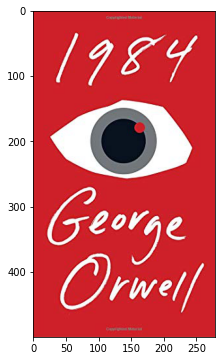

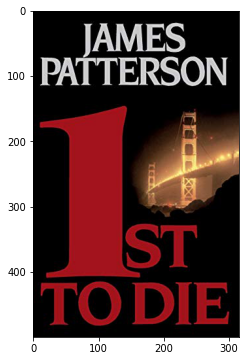

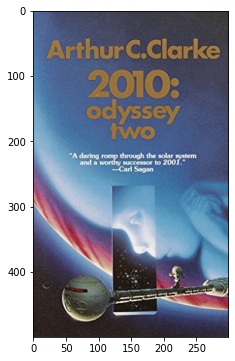

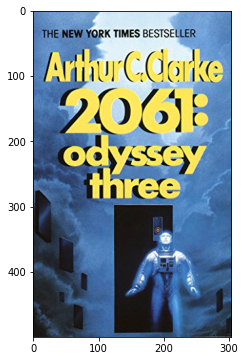

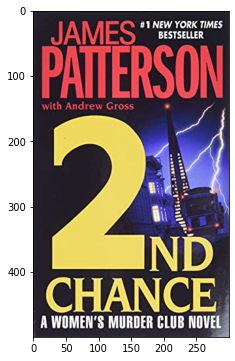

In [116]:
# function call that predicts 5 books to user 1424 and returns the user_data(books that have been rated by user 1424)
user_data, recos=collaborative_model_based(ratings_predicted,1424,final_filtered_data,5)

In [117]:
# information of books rated by user 1424
user_data

,Book-Title,Book-Author,Publisher,Book-Rating,Average-Rating,Book-Rating-Count
0,A Walk in the Woods: Rediscovering America on the Appalachian Trail (Official Guides to the Appalachian Trail),Bill Bryson,Broadway Books,8,8.207547,106
1,Prey,Michael Crichton,Avon Books,8,7.571429,77
2,A Map of the World,Jane Hamilton,Anchor Books/Doubleday,7,7.000000,111
3,The Poisonwood Bible,Barbara Kingsolver,HarperTorch,7,8.264706,34
4,The Name of the Rose: including Postscript to the Name of the Rose,Umberto Eco,Harvest Books,8,8.523810,21
5,The Joy Luck Club,Amy Tan,Prentice Hall (K-12),6,8.195876,194
6,Plain Truth,Jodi Picoult,Washington Square Press,8,8.148936,47
7,The Poisonwood Bible: A Novel,Barbara Kingsolver,Perennial,7,8.178899,218
8,The Bean Trees,Barbara Kingsolver,HarperTorch,5,7.861111,72
9,Memoirs of a Geisha Uk,Arthur Golden,Trafalgar Square,8,8.174419,86


In [118]:
# book recommendations for user 1424
recos

,Book-Title,Book-Author,Publisher,Average-Rating,Book-Rating-Count
0,1984,George Orwell,Signet Book,8.772277,101
1,1st to Die: A Novel,James Patterson,Little Brown and Company,7.661017,59
2,2010: Odyssey Two,Arthur C. Clarke,Del Rey Books,7.413793,29
3,2061: Odyssey Three,Arthur C. Clarke,Del Rey Books,7.666667,18
4,2nd Chance,James Patterson,Warner Vision,7.722222,90


#####***Evaluation of Model Based Collaborative Filtering***

The model based recommender is examined in detail and the results obtained by the SVD model that provided the best RMSE score.

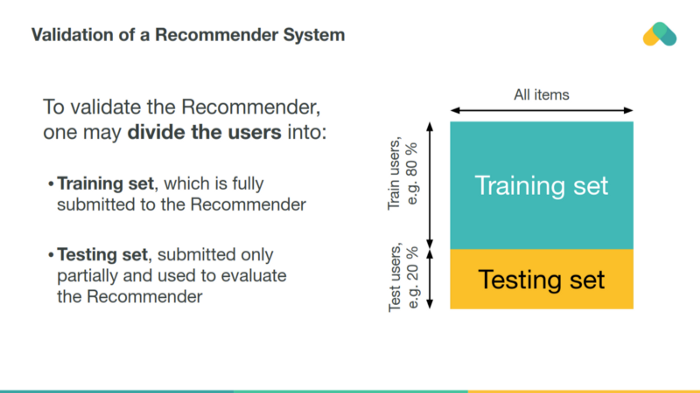

In [119]:
from surprise import Dataset, Reader
from surprise import SVD
from surprise.model_selection import cross_validate, train_test_split, GridSearchCV

In [120]:
df=final_filtered_data.copy()
reader = Reader(rating_scale=(1, 10))
data = Dataset.load_from_df(df[['Book-Title', 'User-ID', 'Book-Rating']], reader)

In [121]:
model_svd = SVD()
cv_results_svd = cross_validate(model_svd, data, cv=5,verbose=True)
pd.DataFrame(cv_results_svd)

Evaluating RMSE, MAE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    1.5079  1.5381  1.4991  1.5337  1.4900  1.5138  0.0190  
MAE (testset)     1.1365  1.1562  1.1308  1.1535  1.1341  1.1422  0.0105  
Fit time          1.25    1.18    1.20    1.20    1.22    1.21    0.02    
Test time         0.04    0.03    0.05    0.03    0.04    0.04    0.01    


,test_rmse,test_mae,fit_time,test_time
0,1.507941,1.136463,1.245739,0.044505
1,1.538055,1.156198,1.180449,0.033768
2,1.499127,1.130795,1.195622,0.052999
3,1.533655,1.153542,1.199817,0.034745
4,1.490010,1.134109,1.221107,0.041026


In [122]:
# mean results 
pd.DataFrame(cv_results_svd).mean()

test_rmse    1.513758
test_mae     1.142222
fit_time     1.208547
test_time    0.041409
dtype: float64

In [123]:
trainset, testset = train_test_split(data, test_size=0.2)
# split data into train and test 
model_naive = SVD()
model_naive.fit(trainset)

Hyperparameter Tuning

In [124]:
# hyperparameter tuning to optimize the results using best parameters 
param_grid = {'n_factors': [80,100],
              'n_epochs': [5, 20],
              'lr_all': [0.002, 0.005],
              'reg_all': [0.2, 0.4]}

gs = GridSearchCV(SVD, param_grid, measures=['rmse', 'mae'], cv=5)
gs.fit(data)

In [125]:
print(gs.best_score['rmse'])
print(gs.best_params)

1.5001465155935079
{'rmse': {'n_factors': 80, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.2}, 'mae': {'n_factors': 100, 'n_epochs': 20, 'lr_all': 0.005, 'reg_all': 0.2}}


***Optimal RMSE obtained= 1.50***

In [126]:
trainset, testset = train_test_split(data, test_size=0.2)

# using the best parameters to fit the model
model = SVD(n_factors=80, n_epochs=20, lr_all=0.005, reg_all=0.2)
model.fit(trainset)
# predictions- stores the predicted ratings for the test dataset 
predictions = model.test(testset)

In [127]:
# predicts the ratings that user 1424 would provide to the book that he has already rated it has 7 
# predicting already rated book 
model_naive.predict("The Poisonwood Bible",1424)


Prediction(uid='The Poisonwood Bible', iid=1424, r_ui=None, est=7.226614905389189, details={'was_impossible': False})

The user has already rated the book- The Poisonwood Bible as 7, and the predicted rating is 7.254 - rounded off to 7  

In [128]:
# predicts the ratings that user 1424 would provide to the book 
# predicting the unseen book rating 
model.predict("1st to Die: A Novel",1424)


Prediction(uid='1st to Die: A Novel', iid=1424, r_ui=None, est=7.525228289595462, details={'was_impossible': False})

Estimates the rating as 7.67 for the book the user hasn't interacted with earlier.

In [129]:
predictions
# contains the predictions of ratings for books in test set 

[Prediction(uid='Couplehood', iid=270352, r_ui=6.0, est=6.02292168081682, details={'was_impossible': False}),
 Prediction(uid='Blue Diary', iid=268110, r_ui=6.0, est=7.0566879801591575, details={'was_impossible': False}),
 Prediction(uid='The Golden Compass (His Dark Materials, Book 1)', iid=128835, r_ui=9.0, est=8.418505160990108, details={'was_impossible': False}),
 Prediction(uid='Strangers', iid=158295, r_ui=6.0, est=6.900480432644625, details={'was_impossible': False}),
 Prediction(uid='The Lovely Bones: A Novel', iid=108405, r_ui=9.0, est=8.095688809606656, details={'was_impossible': False}),
 Prediction(uid='The Pact: A Love Story', iid=21014, r_ui=9.0, est=7.961695907129436, details={'was_impossible': False}),
 Prediction(uid="Don't Sweat the Small Stuff and It's All Small Stuff : Simple Ways to Keep the Little Things from Taking Over Your Life (Don't Sweat the Small Stuff Series)", iid=11676, r_ui=6.0, est=7.4464714241200936, details={'was_impossible': False}),
 Prediction(uid

In [130]:
df_pred = pd.DataFrame(predictions, columns=['Book-Title','User-ID', 'Book-Rating', 'Predicted-Book-Rating', 'details'])
df_pred['impossible'] = df_pred['details'].apply(lambda x: x['was_impossible'])
df_pred['Predicted-Book-Rating'] = df_pred['Predicted-Book-Rating'].round()
df_pred['Absolute-Error'] = abs(df_pred['Predicted-Book-Rating'] - df_pred['Book-Rating'])
df_pred.drop(['details'], axis=1, inplace=True)
df_pred.sample(5)

,Book-Title,User-ID,Book-Rating,Predicted-Book-Rating,impossible,Absolute-Error
4860,Me Talk Pretty One Day,69378,9.0,8.0,False,1.0
901,One Hundred Years of Solitude,129716,9.0,9.0,False,0.0
2153,The Regulators,210485,6.0,7.0,False,1.0
390,Zen and the Art of Motorcycle Maintenance: An Inquiry into Values,11676,7.0,8.0,False,1.0
376,Dark Angel,112001,10.0,9.0,False,1.0


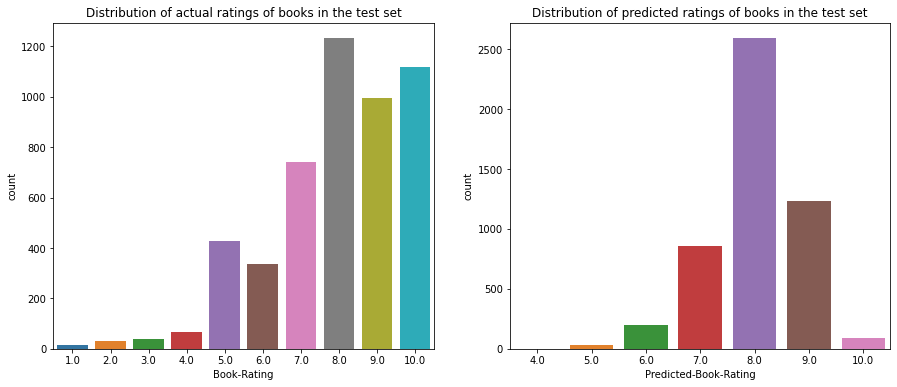

In [131]:
# plotting actual and presicted ratings
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

sns.countplot(x='Book-Rating', data=df_pred, ax=ax1)
ax1.set_title('Distribution of actual ratings of books in the test set')

sns.countplot(x='Predicted-Book-Rating', data=df_pred,ax=ax2)
ax2.set_title('Distribution of predicted ratings of books in the test set')

plt.show()

Distribution of actual and predicted ratings in the test set can be observed. 

* According to the distribution of actual ratings of books in the test set, the biggest part of users give positive scores - between 5 and 10.
* The distribution of predicted ratings in the test set is visibly different.  8 is a the largest rated number and other ratings are comparatively lesser.
* Therefore the recommender system doesn't go very well with the recommender expectations

The absolute error between the actual and predicted ratings for different rating values are plotted. This shows that, rating-8 has the least absolute error, since the predicted ratings are mostly 8 and large number of actual ratings also go with 8.

It can be observed that the absolutte error tends to be higher for lower ratings, indicating that the model hasn't captured the features about low ratings.

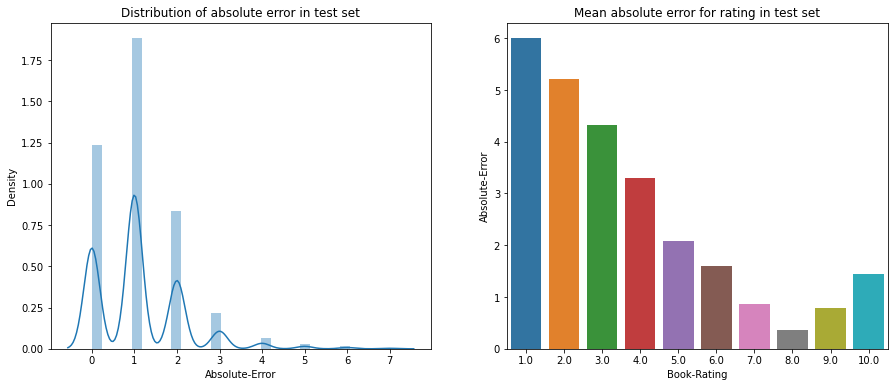

In [132]:
# plotting the absolutte error between actual and predicted ratings 
df_pred_err = df_pred.groupby('Book-Rating')['Absolute-Error'].mean().reset_index()

fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(15, 6))

sns.distplot(df_pred['Absolute-Error'], ax=ax1)
ax1.set_title('Distribution of absolute error in test set')

sns.barplot(x='Book-Rating', y='Absolute-Error', data=df_pred_err, ax=ax2)
ax2.set_title('Mean absolute error for rating in test set')

plt.show()

##***Summary*** 



Generally recommended systems are the algorithms that suggest relevant items to users. Given the “Book-Crossing” dataset with different files for books, users, and ratings, an attempt is made to recommend books to users based on the dataset. Book recommendation not only helps users in obtaining the next book of their interest to read but also the algorithm allows users to explore new interests. In this project, we study different paradigms of recommender systems, for each of which we describe their theoretical basis, study their working, and implementation, and discuss their pros and cons.

Data preprocessing is performed in order to validate the anomalous data, handle missing values, check the outliers, perform feature formatting, etc. The missing values in the features are chosen to be replaced by the respective median value. The exploratory data analysis gives the basis for hypotheses/understandings.

New features “Average-Rating” and “Book-Rating-Count” are introduced that are obtained using the feature ‘Book-Rating”. The “Average-Rating” gives the mean rating of the book. Whereas, the “ Book-Rating-Count” indicates the number of users that have rated the book. 

Different paradigms of recommender systems, considered for the implementation of book recommender system are

* ***Popularity-Based Recommender System*** 
It's a kind of recommendation system that works on the principle of popularity and/or whatever is trending. Average-Rating is used to make popular recommendations given that the book has a minimum required number of ratings. It is advantageous due to its simplicity, less computational usage, and ease to keep updated. However, there is a Lack of personalization, and poor accuracy in recommendations, implying fewer profits generated. 
The popular books that are recommended by the algorithm are quite popular ones with decent ratings on “GoodReads”.

* ***Weighted-Average-based Recommender System***
The index used for recommendation here is the weighted average score. It is calculated using ‘Book-Rating’, the mean rating of books in the dataset, and requires a minimum number of ratings to be considered for recommendation. Though the algorithm doesn’t make recommendations that are sensitive to users’ preferences, it can be considered to perform pretty well, given the requirement for generic recommendations.
The most rated books based on weighted average ratings consider the optimal proportion of both the average rating of the book and the number of ratings into account.

* ***Memory-Based Collaborative Filtering Recommendation System***
Initially, data is filtered in order to get the users that have rated a required number of books and the books that do have a minimum number of ratings required. Given the preferred book of the user, the algorithm recommends books similar to the preference given.  The similarity between the books is computed using the book ratings that are stored in the user-item interaction matrix, based on the cosine rule. It tries to bring the item-based similarity and make similar recommendations. However, this method is not scalable, in applications with large data due to high computations. 
The algorithm recommends books similar to the preferred one based on a similarity score of about 3.36.

* ***Model-Based Collaborative Filtering Recommendation System***
New representations of books and users are built based on a model that considers dense vectors of reduced dimension. Recommendations are done following the model information. It relies on the user-item interaction matrix and assumes latent factors in order to explain the interactions. Matrix factorization method  SVD(Singular Value Decomposition) is considered that decomposes the huge sparse user-item interaction matrix into a product of dense and small user and item factor matrices.
Given a user, the model returns the information regarding books that are rated by the user and the top book recommendations that can be explored by the user. (unseen/new to the user).
The evaluation using the tuned SVD model results in an ***RMSE value of 1.50***. 

*The user/item-specific recommendation requires prior data, leading to the cold-start problem. Therefore possible solutions for the same would be to use the hybrid model of popularity-based/ weighted-average-based recommenders with the collaborative filtering approaches that require user/item data.*

